In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Reading the data
df = pd.read_csv(r"nearest-earth-objects(1910-2024).csv")
df

,neo_id,name,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,orbiting_body,relative_velocity,miss_distance,is_hazardous
0,2162117,162117 (1998 SD15),19.140,0.394962,0.883161,Earth,71745.40105,5.814362e+07,False
1,2349507,349507 (2008 QY),18.500,0.530341,1.185878,Earth,109949.75710,5.580105e+07,True
2,2455415,455415 (2003 GA),21.450,0.136319,0.304818,Earth,24865.50680,6.720689e+07,False
3,3132126,(2002 PB),20.630,0.198863,0.444672,Earth,78890.07681,3.039644e+07,False
4,3557844,(2011 DW),22.700,0.076658,0.171412,Earth,56036.51948,6.311863e+07,False
...,...,...,...,...,...,...,...,...,...
338194,54403809,(2023 VS4),28.580,0.005112,0.011430,Earth,56646.98599,6.406548e+07,False
338195,54415298,(2023 XW5),28.690,0.004859,0.010865,Earth,21130.76895,2.948883e+07,False
338196,54454871,(2024 KJ7),21.919,0.109839,0.245607,Earth,11832.04103,5.346078e+07,False
338197,54456245,(2024 NE),23.887,0.044377,0.099229,Earth,56198.38273,5.184742e+06,False


In [3]:
# Helpful to know the data type of each column as it has to be changed sometimes, in addition to number of non-values.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338199 entries, 0 to 338198
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   neo_id                  338199 non-null  int64  
 1   name                    338199 non-null  object 
 2   absolute_magnitude      338171 non-null  float64
 3   estimated_diameter_min  338171 non-null  float64
 4   estimated_diameter_max  338171 non-null  float64
 5   orbiting_body           338199 non-null  object 
 6   relative_velocity       338199 non-null  float64
 7   miss_distance           338199 non-null  float64
 8   is_hazardous            338199 non-null  bool   
dtypes: bool(1), float64(5), int64(1), object(2)
memory usage: 21.0+ MB


In [4]:
# Check the number of nulls of each column.
df.isna().sum()

neo_id                     0
name                       0
absolute_magnitude        28
estimated_diameter_min    28
estimated_diameter_max    28
orbiting_body              0
relative_velocity          0
miss_distance              0
is_hazardous               0
dtype: int64

### We can notice from the two previous cells that the number of null values is not large compared to the size of the date, so we can remove them all with no worry about effecting on the data.

In [46]:
# Dropping null values and storing it in another data frame having the cleaned version of data.
cleaned_df = df.dropna()
cleaned_df.isna().sum()

neo_id                    0
name                      0
absolute_magnitude        0
estimated_diameter_min    0
estimated_diameter_max    0
orbiting_body             0
relative_velocity         0
miss_distance             0
is_hazardous              0
dtype: int64

In [6]:
# Checking the size of the cleaned data after removing the nulls, to know whether these nulls were in different rows or not.
cleaned_df.shape

(338171, 9)

### Just 28 rows were removed means that all nulls were in the same 28 rows not in different ones.

In [7]:
# Checking for duplicates.
cleaned_df.duplicated().sum()

0

In [8]:
# Giving some statistics about the data.
cleaned_df.describe()

,neo_id,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,relative_velocity,miss_distance
count,3.381710e+05,338171.000000,338171.000000,338171.000000,338171.000000,3.381710e+05
mean,1.760041e+07,22.932525,0.157812,0.352878,51060.017994,4.153547e+07
std,2.287276e+07,2.911216,0.313885,0.701869,26399.922831,2.077411e+07
min,2.000433e+06,9.250000,0.000511,0.001143,203.346432,6.745533e+03
25%,3.373980e+06,20.740000,0.025384,0.056760,30710.626400,2.494495e+07
50%,3.742127e+06,22.800000,0.073207,0.163697,47557.046400,4.332724e+07
75%,5.405374e+07,25.100000,0.189041,0.422708,66673.223795,5.933961e+07
max,5.446281e+07,33.580000,37.545248,83.953727,291781.106600,7.479865e+07


## Feature Selection (Select the important features of data)

In [9]:
# Getting the number of the unique values of each column in the data.
cleaned_df.nunique()

neo_id                     33511
name                       33511
absolute_magnitude          1778
estimated_diameter_min      1778
estimated_diameter_max      1778
orbiting_body                  1
relative_velocity         338020
miss_distance             337798
is_hazardous                   2
dtype: int64

In [10]:
# Getting the unique values of the 'orbiting_body' column.
cleaned_df['orbiting_body'].unique()

array(['Earth'], dtype=object)

### From the provious two cells, we note that the entire column of "oribting_body" has just one value, Earth, so it has no effect on our the data and it will be removed, in adition to both of "neo_id" and "name" columns as the ID and the name have no effect on the other data, as well.

In [47]:
# Dropping both, "orbiting_body" and "name", columns from the cleaned version.
cleaned_df.drop(["neo_id","name", "orbiting_body"], axis = 1, inplace = True)
cleaned_df

,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,relative_velocity,miss_distance,is_hazardous
0,19.140,0.394962,0.883161,71745.40105,5.814362e+07,False
1,18.500,0.530341,1.185878,109949.75710,5.580105e+07,True
2,21.450,0.136319,0.304818,24865.50680,6.720689e+07,False
3,20.630,0.198863,0.444672,78890.07681,3.039644e+07,False
4,22.700,0.076658,0.171412,56036.51948,6.311863e+07,False
...,...,...,...,...,...,...
338194,28.580,0.005112,0.011430,56646.98599,6.406548e+07,False
338195,28.690,0.004859,0.010865,21130.76895,2.948883e+07,False
338196,21.919,0.109839,0.245607,11832.04103,5.346078e+07,False
338197,23.887,0.044377,0.099229,56198.38273,5.184742e+06,False


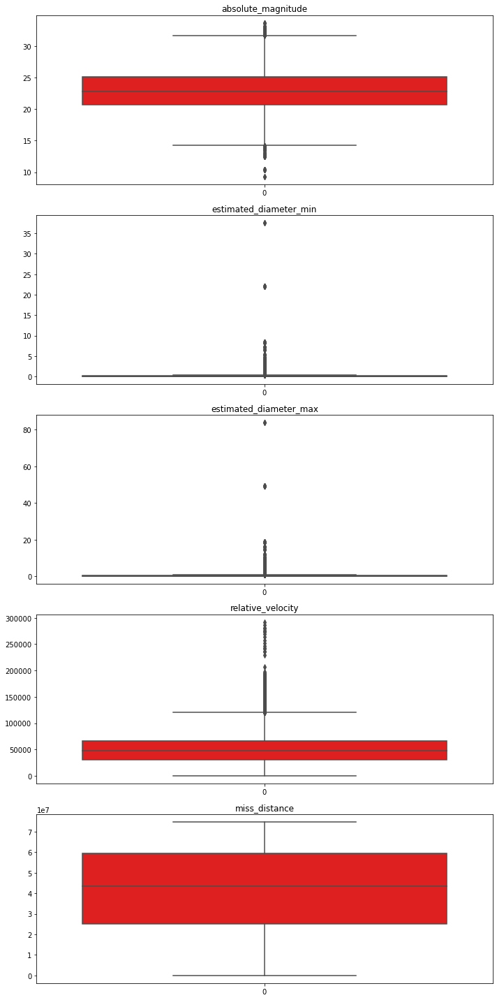

In [12]:
# Set up the figure and subplots with 5 rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(10, 20))  # 5 rows, 1 column

# Loop through each column and create a colored boxplot using Seaborn
for i, col in enumerate(cleaned_df.select_dtypes(include='number').columns):
    sns.boxplot(data=cleaned_df[col], ax=axs[i], color='red')
    axs[i].set_title(col)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

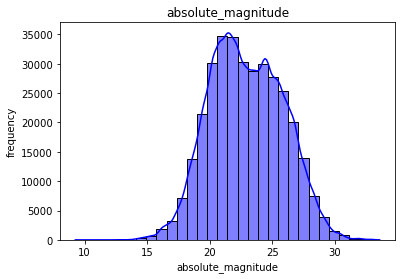

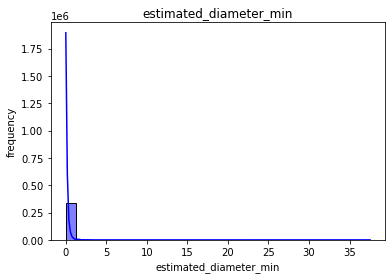

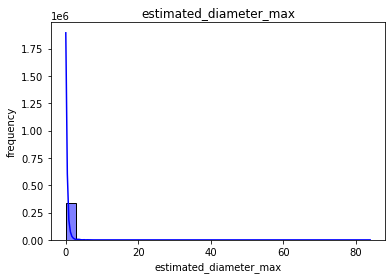

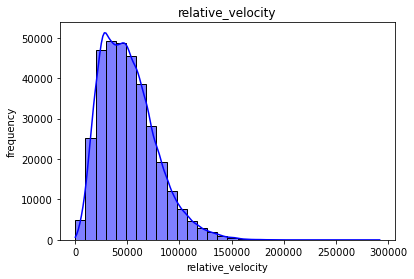

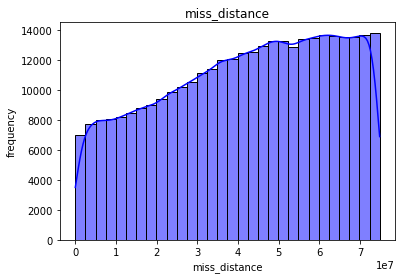

In [13]:
for i, feature in enumerate(cleaned_df.select_dtypes(include='number').columns):
    sns.histplot(data=cleaned_df, x=feature, bins=30, kde=True, color='blue')
    plt.title(f'{feature}')
    plt.xlabel(f'{feature}')
    plt.ylabel('frequency')
    plt.show()

### Box and bar plots above show that there are outliers need to be removed to not affect the model that is based on this data, especially for both of min and max estimated diameter column as they have a lot of outliers.

In [14]:
def handle_outliers(df, column):
  # Set the 1st and 3rd quartile.  
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)

  # Calculate the interquartile range.  
  IQR = Q3 - Q1

  # Calculate the both, the lower and upper bounds.
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
    
  # Return only column that in between lower and upper bounds inclusive.  
  df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
  return df

In [58]:
# Pass each numeric column to the "handle_outliers" function.
for col in cleaned_df.select_dtypes(include=np.number).columns:
  cleaned_df = handle_outliers(cleaned_df, col)

# Get the shape of the cleaned version after removing the outliers.
cleaned_df.shape

(295768, 6)

### 42,403 rows have been removed after excluding the outliers. Below, the box plots again after.

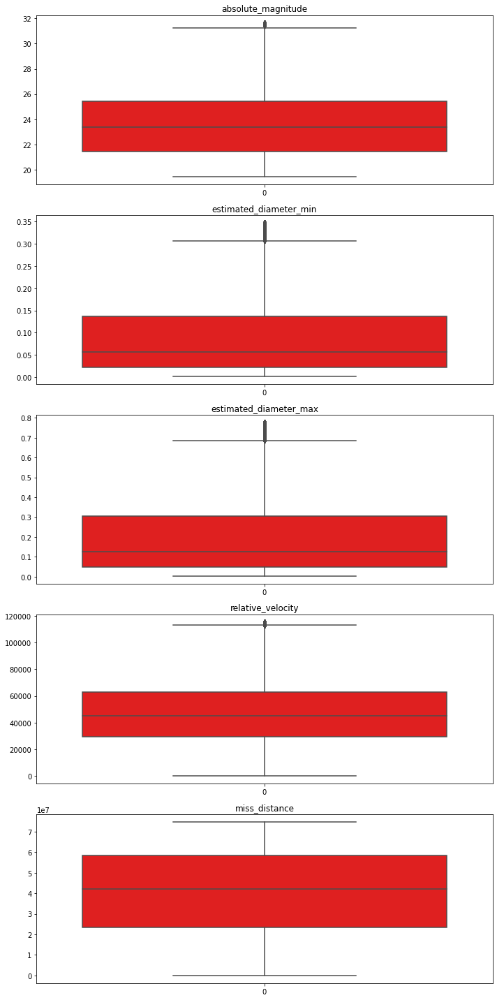

In [16]:
# Reset index after outlier removal
cleaned_df = cleaned_df.reset_index(drop=True)

# Set up the figure and subplots with 5 rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(10, 20))  # 5 rows, 1 column

# Loop through each column and create a colored boxplot using Seaborn
for i, col in enumerate(cleaned_df.select_dtypes(include='number').columns):
    sns.boxplot(data=cleaned_df[col], ax=axs[i], color='red')
    axs[i].set_title(col)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

## Exploring Data

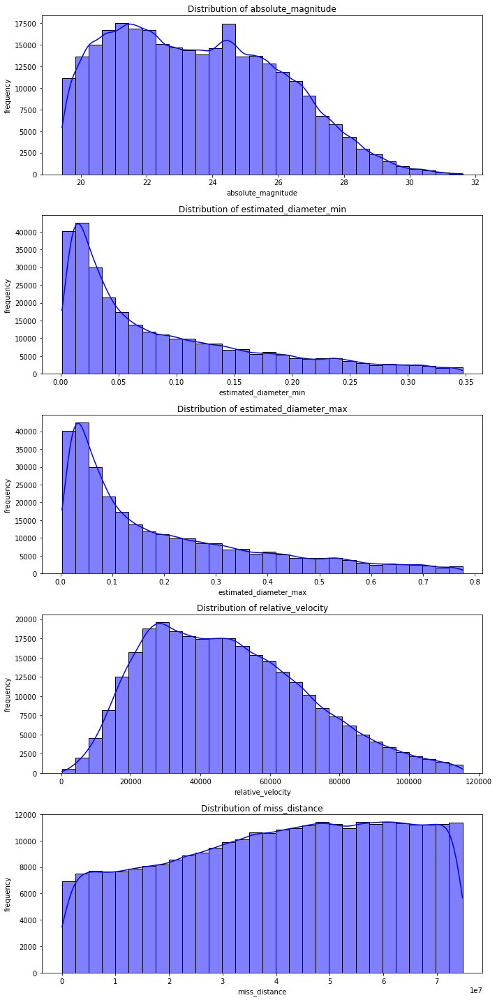

In [17]:
# Set up the matplotlib figure
plt.figure(figsize=(10, 20))

# Loop through each quantitative variable and create a subplot for visualization
for i, feature in enumerate(cleaned_df.select_dtypes(include='number').columns, 1):
    plt.subplot(5, 1, i)

    # Create a histogram for the current variable
    sns.histplot(data=cleaned_df, x=feature, kde=True, color='blue', bins=30)

    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('frequency')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

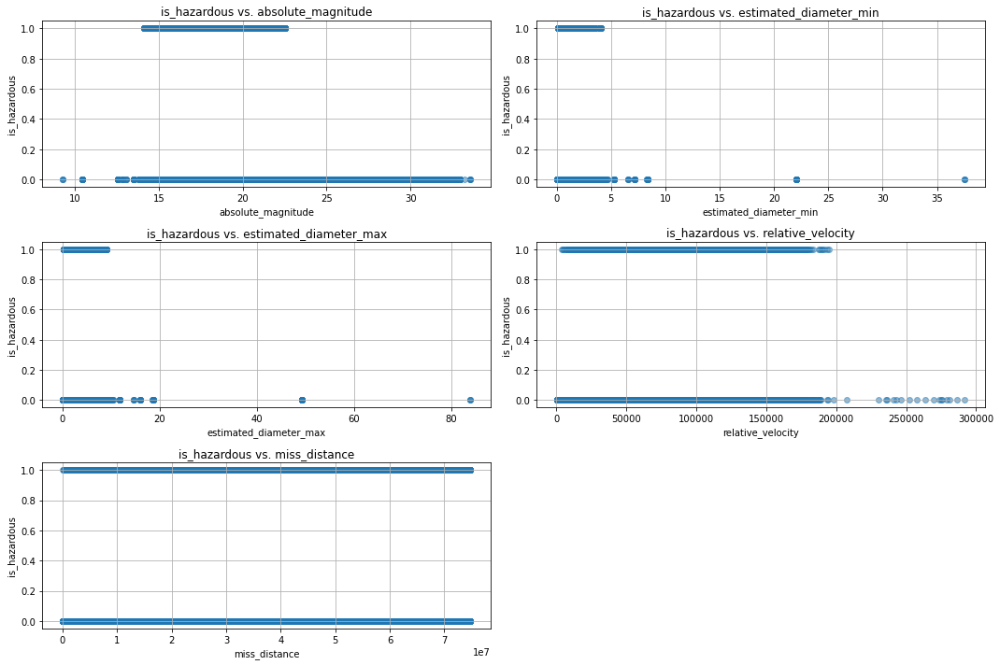

In [18]:
# Plot the relationships between weekly sales and other numeric features.
numeric_features = ['absolute_magnitude', 'estimated_diameter_min', 'estimated_diameter_max', 'relative_velocity', 'miss_distance']

plt.figure(figsize=(15, 10))

for i, feature in enumerate(numeric_features, 1):
    plt.subplot(3, 2, i)
    plt.scatter(df[feature], df['is_hazardous'], alpha=0.5)
    plt.title(f'is_hazardous vs. {feature}')
    plt.xlabel(feature)
    plt.ylabel('is_hazardous')
    plt.grid(True)

plt.tight_layout()
plt.show()

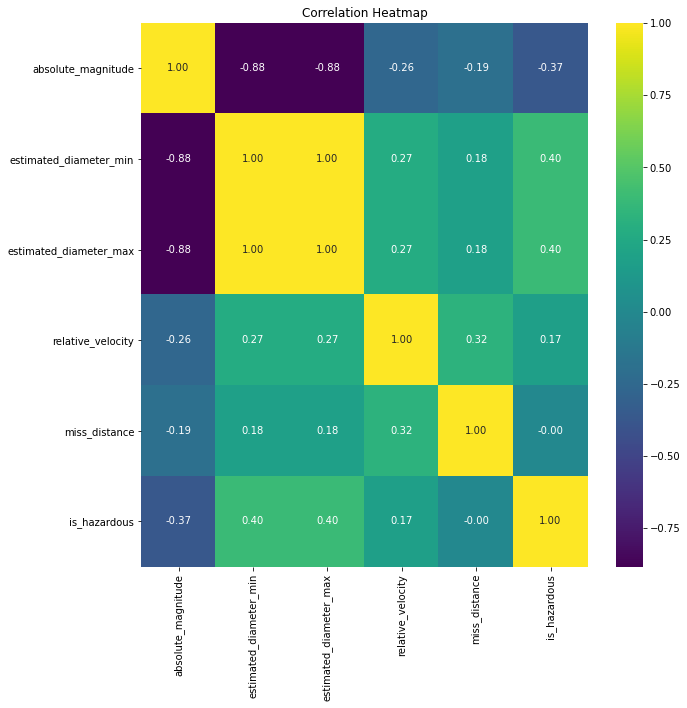

In [19]:
plt.figure(figsize=(10,10))

# Create the heatmap based on the correlation matrix.
sns.heatmap(cleaned_df.corr(), annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [59]:
fig = px.pie(cleaned_df, names='is_hazardous', title='Percentage Of is_hazardous')
fig.show()

### The bie chart above shows that the data is not balanced at all, so we have to make it balanced data.

In [60]:
# Extracting the features' columns of the data.
X = cleaned_df.iloc[:, :-1]

# Extracting the target column of the data.
y = cleaned_df.iloc[:, -1]

In [61]:
# Applying Synthetic Minority Over-sampling Technique
somte = SMOTE(random_state=42)

X, y = somte.fit_resample(X, y)

y.value_counts()

False    263579
True     263579
Name: is_hazardous, dtype: int64

In [62]:
# Split the data into training set and testing set
# 'stratify=y'ensures that the distribution of the target column is proportionally represented in both the training and testing sets
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=44, stratify=y, test_size=0.3)

# Display the number of rows and column of each one
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((369010, 5), (369010,), (158148, 5), (158148,))

In [63]:
fig = px.pie(y, names='is_hazardous', title='Percentage Of is_hazardous')
fig.show()

## Creating Model (based on random forest classification)

In [64]:
random_forest_model = RandomForestClassifier(random_state=44)

random_forest_model.fit(x_train, y_train)

RandomForestClassifier(random_state=44)

## Evaluation

In [65]:
# Testing the output label by the testing set
y_predict = random_forest_model.predict(x_test)

# Compare predicted y and y_test
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

       False       0.95      0.96      0.96     79074
        True       0.96      0.95      0.96     79074

    accuracy                           0.96    158148
   macro avg       0.96      0.96      0.96    158148
weighted avg       0.96      0.96      0.96    158148



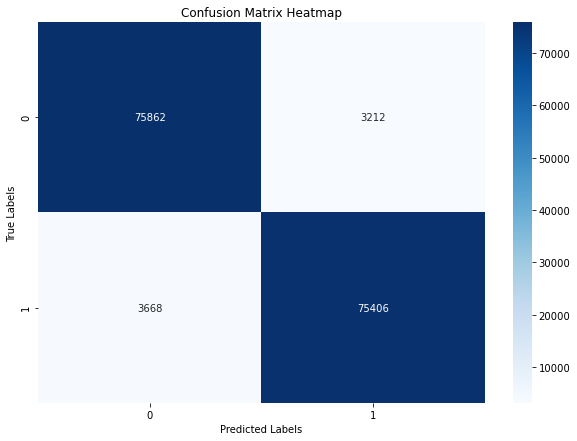

In [66]:
plt.figure(figsize=(10, 7))
sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()